# Text Visualization with Python

This notebook is a **guided tour** of common techniques for *seeing* text.  

We progress from the raw corpus to increasingly sophisticated representations:



1. **Exploratory visuals** – word clouds & token frequencies give a first‑glance feel.

2. **Linguistic structure** – part‑of‑speech tags, lemmas and named entities via *spaCy*.

3. **Vector spaces** – TF–IDF, Word2Vec and Sentence‑BERT let us map text to numbers.

4. **Dimensionality reduction** – PCA and UMAP compress those high‑dimensional vectors so we can plot them in 2‑D.



Along the way we highlight *why* you might pick each tool, typical pitfalls, and how to interpret the resulting plots.

## 0 Prerequisites

Make sure all required packages are installed **before** running the notebook.  

Uncomment the lines below if you need to install anything – they will work on Colab, JupyterLab, VS Code or any environment that can execute shell commands.

In [15]:
# !pip install nltk spacy matplotlib scikit-learn gensim umap-learn wordcloud sentence-transformers
# !python -m spacy download en_core_web_sm

## 1 Imports & Runtime Setup

Below we import:

| Library | Role |
| --- | --- |
| **nltk** | lightweight tokenisation, stop‑word lists, POS tags, lemmatiser |
| **spaCy** | industrial‑strength NLP for syntactic parses & named entities |
| **wordcloud** | generates the word‑cloud image |
| **scikit‑learn** | TF–IDF vectoriser & PCA implementation |
| **UMAP** | non‑linear manifold projection that reveals local clusters |
| **gensim** | Word2Vec training |
| **sentence‑transformers** | pretrained SBERT sentence embeddings |

We also download the small NLTK corpora needed for stop‑words, tokenisation and POS‑tagging.

In [16]:
import nltk
import spacy
import altair as alt
import pandas as pd
import numpy as np
# remove max_rows limit for Altair
alt.data_transformers.enable('default', max_rows=None)

import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from wordcloud import WordCloud

from nltk.corpus import stopwords
from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

import umap

from gensim.models import Doc2Vec
from sentence_transformers import SentenceTransformer

from spacy import displacy

# Download NLTK resources the first time you run the notebook
nltk.download("punkt")
nltk.download('punkt_tab')
nltk.download("stopwords")
nltk.download("averaged_perceptron_tagger")
nltk.download('averaged_perceptron_tagger_eng')
nltk.download("wordnet")


[nltk_data] Downloading package punkt to /Users/filsilva/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/filsilva/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/filsilva/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/filsilva/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/filsilva/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/filsilva/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## 2 Load Your Dataset

For this demo we use the **`ukraine_tweets.csv`** dataset that contains a column `Text` with raw tweet bodies.  

Feel free to substitute your own dataset – just make sure to point `df['Text']` to the right column.

In [17]:
df = pd.read_csv("../../Datasets/ukraine_tweets.csv") # adjust your path accordingly
# drop nans
df.dropna(subset=["Text"], inplace=True)
texts = df["Text"].astype(str).tolist()
print(f"Loaded {len(texts):,} documents.")
print("\n".join(texts[:5]))  # Display the first 5 documents

/var/folders/jh/xkyk5yn976z_y46xvbg2kjjm0000gn/T/ipykernel_25174/74004665.py:1: DtypeWarning: Columns (0,1,2,3,4,5,6,7,11,12,13,14,15,16,17,18) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../../Datasets/ukraine_tweets.csv") # adjust your path accordingly


Loaded 90,892 documents.
🇺🇦 Massive explosions rocks #Kharkiv. #Russia #Ukraine #UkraineWar #RussiaWar #Europe #EU #NATO #US [29] https://t.co/tpTeuYSufO
🇺🇦 Kharkiv is officially being struck by major strikes. #Russia #Ukraine #UkraineWar #RussiaWar #Europe #EU #NATO #US [30] https://t.co/RI5nVtzXHQ
🇺🇦 More angles on that strike in Kharkiv. #Russia #Ukraine #UkraineWar #RussiaWar #Europe #EU #NATO #US [31] https://t.co/j37FksnIzk
🇺🇦 BM-21 Grad strikes opening on #Mariupol city. #Russia #Ukraine #UkraineWar #RussiaWar #Europe #EU #NATO #US [32] https://t.co/bIGoSZ1DN6
🇺🇦 Damage caused by strike in Kharkiv... #Russia #Ukraine #UkraineWar #RussiaWar #Europe #EU #NATO #US [33] https://t.co/XSVb1hy1so


Let's remove tweets starting with trending now as they are just links to news articles and not actual tweets.


In [18]:
# Let's remove tweets with term trending now: as they are just links to news articles and not actual tweets.
texts = [text for text in texts if not "trending now" in text.strip().lower()]
print(f"After removing 'trending now:', we have {len(texts):,} documents out of {len(df):,}.")

After removing 'trending now:', we have 44,069 documents out of 90,892.


There are too many tweets, let's limit ourselves to 10000 sampled randomly from the dataset.

In [19]:
# sample 5000 randomly uniformly
selectionIndices = np.random.choice(len(texts), size=5000, replace=False)
texts = [texts[i] for i in selectionIndices]  # select the sampled texts


## 3 Word‑Cloud

A word cloud is a *very rough* but engaging way to gauge term frequency.  
Use it only as an ice‑breaker – it is sensitive to stop‑word removal, case, and tokenisation nuances, and it completely ignores context.

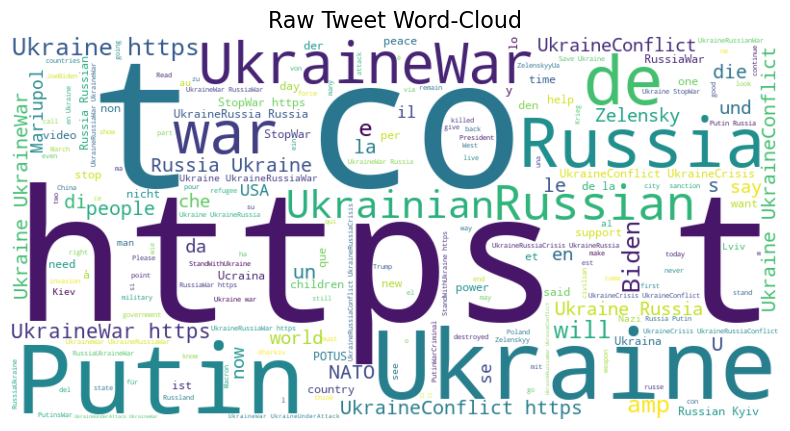

In [20]:
text_blob = " ".join(texts)
wc = WordCloud(width=800, height=400, background_color="white").generate(text_blob)

plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Raw Tweet Word‑Cloud", fontsize=16)
plt.show()


Not very useful, right? # Let's do some preprocessing to make it more meaningful in the next steps.

## 4 NLTK Pre‑processing 

Cleaning text is *crucial* for downstream models.  
Steps we apply:

1. **Tokenise & lowercase** – breaks text into words and removes case differences.
2. **Filter** – drop punctuation, digits and common English stop‑words.
3. **POS‑tag** – assign grammatical roles so lemmatisation knows whether *flies* is a noun or a verb.
4. **Lemmatise** – reduce inflected forms to their dictionary head‑words (e.g., *running* → *run*).

But let's first remove links from the tweets, as they are not useful for our analysis.

In [21]:
# remove links from the text
# detect links using regex
import re
def remove_links(text):
    return re.sub(r"http\S+|www\S+|https\S+", "", text, flags=re.MULTILINE)

# remove links from all texts
texts = [remove_links(text) for text in texts]

The helper `nltk_preprocess` returns a list of clean lemmas ready for vectorisation.

In [22]:
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

def nltk_preprocess(doc: str):
    """Tokenise, clean, POS‑tag and lemmatise a single document."""
    tokens = word_tokenize(doc.lower())
    tokens = [t for t in tokens if t.isalpha() and t not in stop_words]

    pos_tags = pos_tag(tokens)

    def tb2wn(tag):
        return {
            "J": "a", "V": "v", "N": "n", "R": "r"
        }.get(tag[0], "n")

    lemmas = [lemmatizer.lemmatize(tok, tb2wn(pos)) for tok, pos in pos_tags]
    return lemmas

# Apply cleaning to entire corpus
tokenised = [nltk_preprocess(t) for t in tqdm(texts,"preprocessing documents")]
# only keep documents with more than 3 tokens
indices_to_keep = [i for i, toks in enumerate(tokenised) if len(toks) > 3]
tokenised = [tokenised[i] for i in indices_to_keep]
texts = [texts[i] for i in indices_to_keep]

clean_docs = [" ".join(toks) for toks in tokenised]

# Number of documents after cleaning
print(f"Number of documents after cleaning: {len(clean_docs):,}")
# Display the first 5 cleaned documents
print("First 5 cleaned documents:")
for i, doc in enumerate(clean_docs[:5]):
    print(f"{i+1}: {doc}")

preprocessing documents:   0%|          | 0/5000 [00:00<?, ?it/s]

Number of documents after cleaning: 4,683
First 5 cleaned documents:
1: ahora putin russia ucrania ukraine en la ciudad de dubno región de rivne los invasores dispararon contra el depósito de petróleo el jefe de la ovum local vitaliy koval habló sobre el ataque las acciones enemigas en la región
2: talk putin context alexander dugin read good summary glad biden say say
3: smoke bomb mum fearful georgiy want leave house mistake morning fog missile smoke ukrainewar ukraineconflict
4: long ago gerhard schröder call putin pure democrat stil run gag whenever putin thing
5: drone footage show strike ukrainian armor outskirt kyiv ukraine ukrainewar


Now let's create a new word cloud using the pre‑processed text.

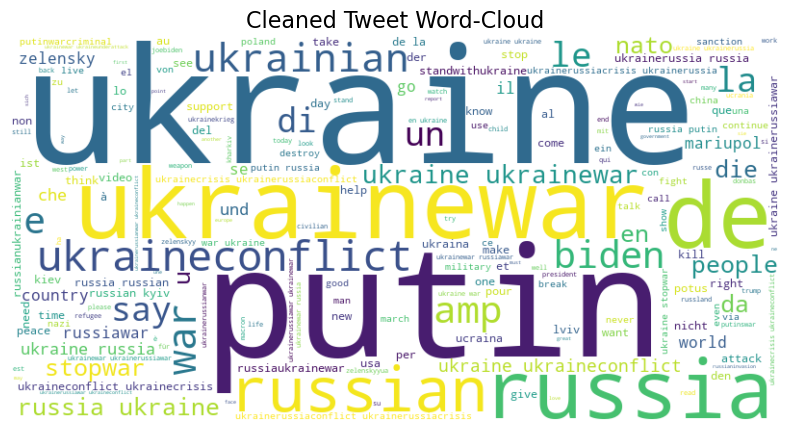

In [23]:
# new word cloud with cleaned documents
text_blob = " ".join(clean_docs)
wc = WordCloud(width=800, height=400, background_color="white").generate(text_blob)
plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Cleaned Tweet Word‑Cloud", fontsize=16)
plt.show()


## 5 TF–IDF Vectors ➜ PCA & UMAP

**Term Frequency–Inverse Document Frequency** weighs tokens so that common words are down‑weighted and rare (but potentially informative) words are emphasised.



Once we have a matrix of size `n_docs × n_terms` (often sparse and very high‑dimensional), we project it to 2‑D:



* **PCA** – linear projection that maximises variance; good for global structure but may blur clusters.

* **UMAP** – non‑linear; preserves local neighbourhoods and often reveals finer clusters at the expense of some distortion.

In [24]:
# Vectorise
vectoriser = TfidfVectorizer(max_features=2_000)
X_tfidf = vectoriser.fit_transform(clean_docs)

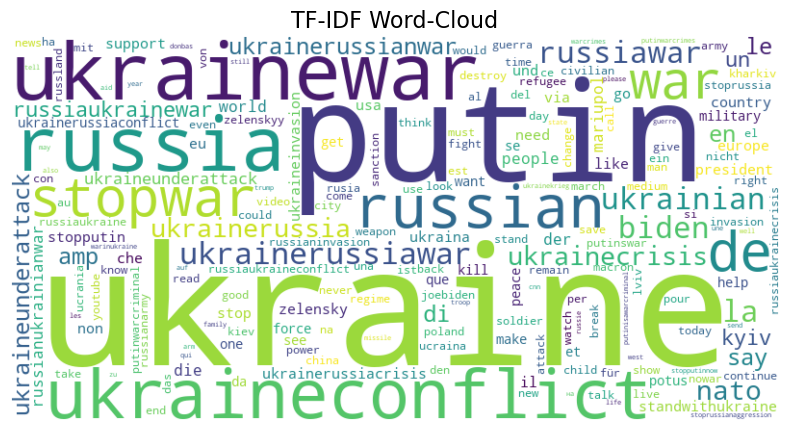

In [25]:
# We can now craete a wordcloud from the TF-IDF scores
tfidf_scores = X_tfidf.sum(axis=0).A1
tfidf_words = vectoriser.get_feature_names_out()
tfidf_dict = dict(zip(tfidf_words, tfidf_scores))
wc = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(tfidf_dict)
plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("TF-IDF Word‑Cloud", fontsize=16)
plt.show()

Ok let's compute PCA. However for TF-IDF vectors we need to use another version of PCA that works with sparse matrices.

In [26]:
# Use truncated SVD (very similar to PCA but for sparse matrices)
from sklearn.decomposition import TruncatedSVD
coords_pca_t = TruncatedSVD(n_components=2, random_state=0).fit_transform(X_tfidf.toarray())

We will also look at UMAP, which is a non-linear manifold learning technique that can reveal local clusters in the data.

In [27]:
# UMAP
coords_umap_t = umap.UMAP(n_neighbors=10, min_dist=0.2, random_state=0, n_epochs=1000, metric='euclidean').fit_transform(X_tfidf)


/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Let's plot them

In [28]:
# Prepare data for Altair
pca_df = pd.DataFrame(coords_pca_t, columns=["x", "y"])
pca_df["method"] = "PCA"
pca_df["text"] = clean_docs[:len(coords_pca_t)]  # Add text for PCA

umap_df = pd.DataFrame(coords_umap_t, columns=["x", "y"])
umap_df["method"] = "UMAP"
umap_df["text"] = clean_docs[:len(coords_umap_t)]  # Add text for UMAP

pcaChart = alt.Chart(pca_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="PCA of Tweets"
).interactive()

umapChart = alt.Chart(umap_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="UMAP of Tweets"
).interactive()

pcaChart | umapChart


alt.HConcatChart(...)

## 6 spaCy ▶ Named Entity Recognition & Dependency Parsing

*spaCy* ships with statistical models that identify **named entities** (people, organisations, locations…) and **syntactic dependencies**.  

These views help answer questions like *“Who are the main actors?”* or *“How are subjects and verbs connected?”*

First let's download the small English model for spaCy, which is needed for NER and dependency parsing.

In [29]:
import spacy.cli
import spacy
spacy.cli.download("en_core_web_lg")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.7/400.7 MB 80.5 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


Now let's load the model and process the text.

In [30]:

nlp = spacy.load("en_core_web_lg")
# create a sample document to visualise
text_sample = "This is a sample text for entity recognition. Ana is a great person, and she works at Indiana University. The capital of France is Paris, and the founder of Microsoft is Bill Gates."
example_doc = nlp(text_sample)

print("Entities found:\n")
for ent in example_doc.ents:
    print(f" • {ent.text:<30} → {ent.label_}")

# Visualise (uncomment when running inside Jupyter)
displacy.render(example_doc, style="ent", jupyter=True)
displacy.render(example_doc, style="dep", jupyter=True, options={"distance": 90})


Entities found:

 • Ana                            → PERSON
 • Indiana University             → ORG
 • France                         → GPE
 • Paris                          → GPE
 • Microsoft                      → ORG
 • Bill Gates                     → PERSON


Let's get the named entities for all the tweets in the dataset and plot the word cloud.

Extracting entities: 0it [00:00, ?it/s]

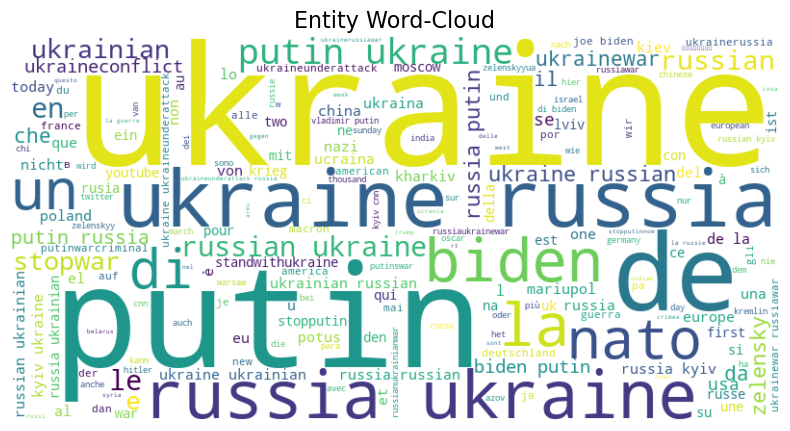

In [31]:
entities = []
for doc in tqdm(nlp.pipe(clean_docs, batch_size=1000), desc="Extracting entities"):
    for ent in doc.ents:
        entities.append(ent.text)
# Create a word cloud from the entities
entity_blob = " ".join(entities)
wc = WordCloud(width=800, height=400, background_color="white").generate(entity_blob)
plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Entity Word‑Cloud", fontsize=16)
plt.show()


## 7 Doc2Vec Embeddings ➜ PCA & UMAP

**Doc2Vec** learns vectors such that documents (or sentences) appearing in similar contexts lie close in space.  

By projecting those vectors we can inspect semantic clusters (*city‑country*, *positive‑negative*, etc.).  
Additionally, we can visualize these embeddings using PCA and UMAP to better understand the relationships between documents.

In [32]:
# Train (skip very infrequent words to keep it fast)
from gensim.models import Doc2Vec
from gensim.models.doc2vec import TaggedDocument
from gensim.utils import simple_preprocess

tagged_corpus = [
    TaggedDocument(words=simple_preprocess(doc),  # token list
                   tags=[f'DOC_{i}'])             # unique tag
    for i, doc in enumerate(texts)
]

# Hyper-parameters below are sensible starting points:
model = Doc2Vec(
    vector_size=128,    # dimensionality of the embeddings
    window=10,          # context window for skip-gram
    min_count=2,        # ignore words that appear < 2 times
    dm=1,               # 1 = Distributed Memory (PV-DM), 0 = DBOW
    workers=4,          # CPU cores
    epochs=40,          # training iterations
    seed=42
)

# Build vocabulary – scans corpus once
model.build_vocab(tagged_corpus)

# Train – multiple epochs; shuffle each pass for robustness
for epoch in tqdm(range(model.epochs), desc="Training"):
    model.train(tagged_corpus,
                total_examples=model.corpus_count,
                epochs=1)

# As NumPy arrays, in the order of your original list
doc_vectors = [model.dv[f'DOC_{i}'] for i in range(len(texts))]


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Let's create the PCA and UMAP projections.

In [33]:
coords_doc2vec_pca = PCA(n_components=2, random_state=0).fit_transform(doc_vectors)

coords_doc2vec_umap = umap.UMAP(n_neighbors=10, min_dist=0.2, random_state=0, n_epochs=1000, metric='cosine').fit_transform(doc_vectors)

/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Now let's plot them.

In [34]:
# Plots
pca_df = pd.DataFrame(coords_doc2vec_pca, columns=["x", "y"])
pca_df["method"] = "PCA"
pca_df["text"] = texts
umap_df = pd.DataFrame(coords_doc2vec_umap, columns=["x", "y"])
umap_df["method"] = "UMAP"
umap_df["text"] = texts
pcaChart = alt.Chart(pca_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="PCA of Doc2Vec Embeddings"
).interactive()
umapChart = alt.Chart(umap_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="UMAP of Doc2Vec Embeddings"
).interactive()
pcaChart | umapChart

alt.HConcatChart(...)

## 8 Sentence‑BERT for Document‑Level Semantics

While Word2Vec treats each *token* separately, **SBERT** yields a single vector per *document*, capturing overall meaning.  

This is perfect for clustering tweets into topics, spotting outliers or feeding downstream classifiers.

In [35]:
model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = model.encode(texts, show_progress_bar=True)
# Visualise the embeddings with PCA and UMAP
coords_sentence_pca = PCA(n_components=2, random_state=0).fit_transform(embeddings)
coords_sentence_umap = umap.UMAP(n_neighbors=10, min_dist=0.2, random_state=0, n_epochs=1000, metric='cosine').fit_transform(embeddings)


Batches:   0%|          | 0/147 [00:00<?, ?it/s]

/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/filsilva/miniforge3/envs/dataviz/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Let's plot them...

In [36]:
# Prepare data for Altair
pca_df = pd.DataFrame(coords_sentence_pca, columns=["x", "y"])
pca_df["method"] = "PCA"
pca_df["text"] = texts  # Add text for PCA
umap_df = pd.DataFrame(coords_sentence_umap, columns=["x", "y"])
umap_df["method"] = "UMAP"
umap_df["text"] = texts  # Add text for UMAP
pcaChart = alt.Chart(pca_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="PCA of Sentence Embeddings"
).interactive()
umapChart = alt.Chart(umap_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    tooltip=["text", "method"]
).properties(
    title="UMAP of Sentence Embeddings"
).interactive()
pcaChart | umapChart

alt.HConcatChart(...)

What if we want to cluster the tweets into topics?
Let's try KMeans clustering on the SBERT embeddings.

In [37]:
# What if we want to cluster the tweets into topics?
# Let's try KMeans clustering on the SBERT embeddings.

from sklearn.cluster import KMeans
# Number of clusters
n_clusters = 9

kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans.fit(embeddings)
# Add cluster labels to the DataFrame
umap_df["cluster_index"] = kmeans.labels_
# Visualise clusters with UMAP
cluster_chart = alt.Chart(umap_df).mark_circle(size=20, opacity=0.5).encode(
    x="x",
    y="y",
    color=alt.Color("cluster_index:N", scale=alt.Scale(scheme='category10')),
    tooltip=["text", "method", "cluster_index"]
).properties(
    title=f"UMAP of Sentence Embeddings with {n_clusters} Clusters"
).interactive()
cluster_chart


alt.Chart(...)

We can now use word clouds to visualise the clusters.

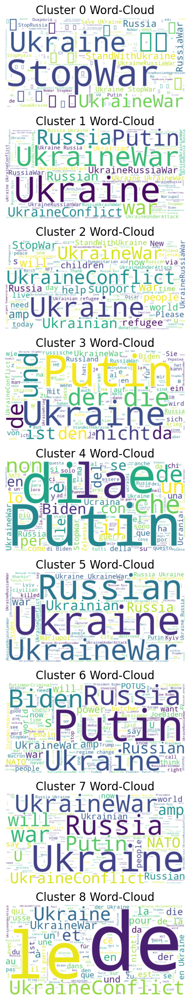

In [38]:
# We can now use word clouds to visualise the clusters.

def generate_wordcloud_for_cluster(cluster_index, df,ax):
    """Generate a word cloud for a specific cluster index."""
    cluster_texts = df[df["cluster_index"] == cluster_index]["text"].tolist()
    text_blob = " ".join(cluster_texts)
    wc = WordCloud(width=800, height=400, background_color="white").generate(text_blob)
    
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"Cluster {cluster_index} Word‑Cloud", fontsize=16)
# Create subplots for each cluster
fig, axes = plt.subplots(nrows=n_clusters, ncols=1, figsize=(20 * n_clusters, 20))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
for i in range(n_clusters):
    generate_wordcloud_for_cluster(i, umap_df, axes[i])
plt.tight_layout()
plt.show()


However it is not very informative, as the clusters are not very distinct (except for those with different languages).

Another option is using log odds ratios, which can help us identify the most distinctive words in each cluster. This is a more advanced technique described in https://www.cambridge.org/core/journals/political-analysis/article/fightin-words-lexical-feature-selection-and-evaluation-for-identifying-the-content-of-political-conflict/81B3703230D21620B81EB6E2266C7A66

You can reuse this code to compute the log odds ratios for each cluster.

In [46]:
# Nothing to see. How about we use log odds ratios to find the most distinctive words in each cluster?
from collections import Counter, defaultdict
import math
# check out the paper: # https://www.aclweb.org/anthology/P17-1003.pdf
def logodds(corpora_dic, bg_counter):
    """ It calculates the log odds ratio of term i's frequency between 
    a target corpus and another corpus, with the prior information from
    a background corpus. Inputs are:
    
    - a dictionary of Counter objects (corpora of our interest)
    - a Counter objects (background corpus)
    
    Output is a dictionary of dictionaries. Each dictionary contains the log 
    odds ratio of each word. 
    
    """
    corp_size = dict([(c, sum(corpora_dic[c].values())) for c in corpora_dic])
    bg_size = sum(bg_counter.values())
    result = dict([(c, {}) for c in corpora_dic])
    
    for name, c in corpora_dic.items():
        for word in c:
            # if 10 > sum(1 for corpus in corpora_dic.values() if corpus[word]):
            #    continue
            
            fi = c[word]
            # 'fi' is the count of 'word' in the current corpus 'c' (target corpus).
            fj = sum(co[word] for x, co in corpora_dic.items() if x != name)
            # 'fj' is the total count of 'word' across all other corpora except the target.
            fbg = bg_counter[word]
            # 'fbg' is the count of 'word' in the background corpus.
            ni = corp_size[name]
            # 'ni' is the total number of words in the target corpus.
            nj = sum(x for idx, x in corp_size.items() if idx != name)
            # 'nj' is the total number of words across all corpora other than the target.
            
            nbg = bg_size  # 'nbg' represents the total number of words in the background corpus.
            oddsratio = math.log(fi+fbg) - math.log(ni+nbg-(fi+fbg)) -\
                        math.log(fj+fbg) + math.log(nj+nbg-(fj+fbg))  # 'oddsratio' calculates the log odds ratio for 'word' using smoothed frequency counts.
            std = 1.0 / (fi+fbg) + 1.0 / (fj+fbg)  # 'std' estimates the variance (denominator) used to standardize the log odds ratio.
            z = oddsratio / math.sqrt(std)  # 'z' is the standardized z-score of the log odds ratio, indicating significance.
            result[name][word] = z  # The z-score is stored in the result dictionary for the given corpus name and word.
            
    # Sort words by log-odds
    grouped_sorted_ngrams = {key: sorted(entry.items(), key=lambda x: x[1], reverse=True)
                             for key, entry in result.items()}
    return grouped_sorted_ngrams


We need two inputs for this function.
One is a dictionary pointing to a Counter of tokens for each cluster (number of times each token appears in each cluster).
The other is a dictionary pointing to a Counter of tokens for the entire dataset (number of times each token appears in the entire dataset).
We can reuse the nltk_preprocess function to compute the tokens for each cluster and the entire dataset.
Let's compute the log odds ratios for each cluster.

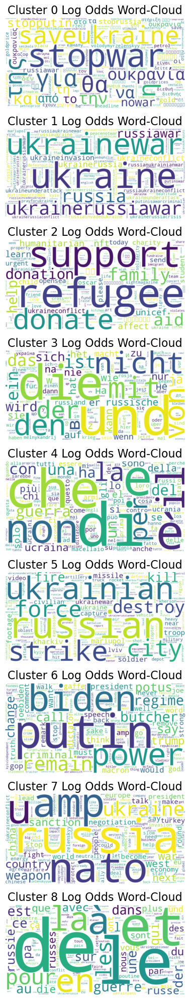

In [47]:
# calculate log odds ratios for each cluster
corpora = defaultdict(Counter)

bg_counter = Counter()
for i,(text, cluster_index) in enumerate(zip(umap_df["text"], umap_df["cluster_index"])):
    tokens = nltk_preprocess(text)
    corpora[cluster_index].update(tokens)
    bg_counter.update(tokens)

# Calculate log odds ratios
log_odds_results = logodds(corpora, bg_counter)
# use wordcloud to visualise the log odds ratios
def generate_wordcloud_from_log_odds(log_odds_dict, ax):
    """Generate a word cloud from log odds ratios."""
    wc = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(log_odds_dict)
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
# Create subplots for each cluster
fig, axes = plt.subplots(nrows=n_clusters, ncols=1, figsize=(20 * n_clusters, 20))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
for i, (cluster_index, log_odds_dict) in enumerate(sorted(log_odds_results.items())):
    generate_wordcloud_from_log_odds(dict(log_odds_dict), axes[i])
    axes[i].set_title(f"Cluster {cluster_index} Log Odds Word‑Cloud", fontsize=16)
plt.tight_layout()
plt.show()

The results are much more informative, as they highlight the most distinctive words in each cluster.

